<a href="https://colab.research.google.com/github/RenanBarreto4/TutorialNotebooks/blob/master/PlotlyNotebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capacitação em Python - ICMC Júnior
## Plotly Notebook
### Criado por: Renan Barreto
### GitHub: https://github.com/RenanBarreto4
### Documentação:  https://plotly.com/python/#controls
### Baseado em:
https://paulovasconcellos.com.br/como-criar-gráficos-interativos-utilizando-plotly-e-python-3eb6eda57a2b

https://www.youtube.com/playlist?list=PLE50-dh6JzC4onX-qkv9H3HtPbBVA8M94

O plotly é uma biblioteca para visualização de dados existente em diferentes linguagens. Se destaca pela interatividade presente em seus gráficos (lembre-se de sempre interagir com os gráficos presentes nesse notebook para melhor entendimento) como zoom, mover os eixos, baixar os gráficos e mais. É uma ótima alternativa ao matplotlib.

In [ ]:
#instalando biblioteca
!pip3 install plotly

In [ ]:
#atualizando biblioteca
!pip3 install -U plotly

Requirement already up-to-date: plotly in /usr/local/lib/python3.6/dist-packages (4.8.2)


In [ ]:
#importando plotly e mostrando a versão  (criado na 4.8.2)
import plotly
import plotly.offline as py
import plotly.graph_objs as go
from plotly import __version__
print(__version__)

4.8.2


In [ ]:
#criando função para o plotly rodar em notebooks (vai precisar usar sempre plotly() quando for plotar)
def plotly():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
  py.offline.init_notebook_mode(connected=True)

In [ ]:
#importando bibliotecas auxiliares
import numpy as np
import pandas as pd

In [ ]:
#criando um gráfico da maneira mais simples
plotly()  #chamando a função para notebooks
py.iplot([{'x': [1,2,3,4,5], 'y': [11,65,33,2,77]}])  #o método iplot de py plota uma "lista" [] que estiver nele

In [ ]:
#gerando números aleatórios para plotar
N = 500
example_x = np.random.rand(N)
example_y = np.random.rand(N)

In [ ]:
#gerando um gráfico de pontos com go.Scatter e mode = 'markers'
plotly()   #chamando a função

trace = go.Scatter(     #definindo um scatter plot
    x = example_x,      #defindo x
    y = example_y,      #defindo y
    marker = dict(size=8,   #definindo o tamanho
                  colorscale='Viridis',   #definindo a paleta de cores
                  color=np.random.randn(500),   #definindo as cores
                  showscale=True,   #mostrando legenda
                  opacity = 0.7),   #definindo a opacidade
    mode = 'markers')   #se não colocar markers ele liga os pontos

data =  [trace]    #é necessário colocar os dados sempre um uma lista

py.iplot(data)   #py.iplot é o método que plota os dados

In [ ]:
#gerando dados
candidatos = ['Renan', 'Gabriel', 'Rafael', 'Emerson', 'Ariel']
quant_votos2020M = [539, 57, 278, 501, 399]
quant_votos2021M = [670, 6, 574, 416,485]
candidatas = ['Amanda', 'Akemi', 'Iara']
quant_votos2020F = [544, 398, 545]
quant_votos2021F = [655, 512, 894]
colors = ['#6495ED', '#4169E1', '#1E90FF', '#00BFFF', '#87CEFA']  #escala de cores hexadecimal de azuis

Para obter mais cores pode acessar: https://celke.com.br/artigo/tabela-de-cores-html-nome-hexadecimal-rgb

In [ ]:
#criando um gráfico de pizza com go.Pie
plotly()   #chamando a função

trace = go.Pie(labels=candidatos, values=quant_votos2020M, #labels define os setores; values define os dados;
               textinfo='label+percent',   #textinfo define as informações que vão aparecer no gráfico estático
               hoverinfo='label+value+percent',   #hoverinfo define o que aparece quando passa o mouse em cima;
               textfont=dict(size=22),   #textfont pode passar o tamnho da letra 
               hole=0.3,   #faz o buraco no meio
               pull=[0.1, 0, 0, 0, 0, 0, 0],   #destaca uma parte do gráfico
               marker=dict(colors=colors, line=dict(color='#ffffff', width=2)))  #marker serve para colocar a paleta de cores com colors; line modifica a linha entre os setores, pintando e aumentando a borda

fig = go.Figure([trace])  #criando uma figura com a lista dos trace

fig.update_layout(title = 'Porcentegem de votos Masculinos',
                  title_font_size = 35,
                  title_x = 0.47,
                  annotations=[dict(text='<b>2020<b>', x=0.5, y=0.5, font_size=20, showarrow=False)])   #coloca a informação no meio do gráfico

py.iplot(fig) #plotando o gráfico numa lista

In [ ]:
#gerando um gráfico de barras com go.Bar
plotly()   #chamando a função

trace1 = go.Bar(x = candidatos, y = quant_votos2020M, name = 'masculino')  #definir variáveis que ficam no x e y
trace2 = go.Bar(x = candidatas, y = quant_votos2020F, name = 'feminino', hoverinfo='y')  #name da o nome para a legenda, hoverifo escolhe o que vai mostrar na interação com o mouse

data = [trace1, trace2]  #passando os dois gráficos para uma lista

fig = go.Figure(data=data)  #criando uma figura para alterar os aspectos estéticos do gráfico

fig.update_layout(title = 'Votação para Presidência',  #adicionando título
                  xaxis_title = 'Candidatos',  #adicionando título ao eixo x
                  yaxis_title = 'Votos',   #adicionando título ao eixo y
                  yaxis_dtick = 50,   #alterando quanto varia o eixo y no gráfico
                  font_size = 17,   #alterando tamanho de todos os textos
                  title_font_size = 35,   #alterando tamanho do título
                  xaxis_title_font_size = 25,   #alterando tamanho do título do eixo x
                  yaxis_title_font_size = 25,  #alterando tamanho do título do eixo y
                  title_x = 0.5,   #colocando o título no meio
                  font_family = "Times New Roman")   #alterando a fonte do texto todo

py.iplot(fig)   #plotando data

In [ ]:
#adicionando subplots
from plotly.subplots import make_subplots   #importando método para gerar subplots

plotly()

trace1 = go.Bar(x = candidatos, y = quant_votos2020M, name = '2020', hoverinfo='y')
trace2 = go.Bar(x = candidatos, y = quant_votos2021M, name = '2021', hoverinfo='y') 

fig = make_subplots(rows=1, cols=2,   #criando figura com 1 linha e 2 colunas
                    subplot_titles=['2020', '2021'])   #atribuindo um subtítulo

fig.add_trace(trace1, row=1, col=1)   #adicionando trace1 na linha1, coluna1
fig.add_trace(trace2, row=1, col=2)   #adicionando trace2 na linha1, coluna2

fig.update_layout(title = 'Votação para Presidência',  #adicionando título
                  font_size = 17,   #alterando tamanho de todos os textos
                  title_font_size = 35,   #alterando tamanho do título
                  yaxis_title = 'Votos',  #alterando o título do eixo y
                  xaxis_title_font_size = 25,   #alterando tamanho do título do eixo x
                  yaxis_title_font_size = 25,  #alterando tamanho do título do eixo y
                  yaxis_dtick = 50,   #alterando quanto varia o eixo y no gráfico
                  title_x = 0.5,   #colocando o título no meio
                  yaxis_range = [0,700],   #alterando range do primeiro gráfico para ir até 700 como o segundo
                  font_family = "Times New Roman")   #alterando a fonte do texto todo

py.iplot(fig)

In [ ]:
#agrupando as barras quando se trata do mesmo x
plotly()

trace1 = go.Bar(x = candidatos, y = quant_votos2020M, name = '2020', marker = {'color': '#feca57'}, hoverinfo = 'y+name')  #marker coloca as cores que quer
trace2 = go.Bar(x = candidatos, y = quant_votos2021M, name = '2021',  marker = {'color': '#ff9f43'})

data = [trace1, trace2]  #passando os dois gráficos para uma lista

fig = go.Figure(data=data)  #criando uma figura para alterar os aspectos estéticos do gráfico

fig.update_layout(barmode='group', #alterando o layout para barras agrupadas com o método Layout, o que já é o padrão (então esse comando é desnecessário)
                  title = 'Votação para Presidência em 2020 e 2021',
                  xaxis_title = 'Candidatos',
                  yaxis_title = 'Votos',
                  font_size = 17,
                  title_font_size = 35,
                  xaxis_title_font_size = 25,
                  yaxis_title_font_size = 25,
                  title_x = 0.5,
                  font_family = "Times New Roman")

py.iplot(fig)


In [ ]:
#mesmo gráfico para barras empilhadas
plotly()

trace1 = go.Bar(x = candidatos, y = quant_votos2020M, name = '2020', marker = {'color': '#22f5a8'}, hoverinfo = 'y+name')  #name passa os nomes da legenda
trace2 = go.Bar(x = candidatos, y = quant_votos2021M, name = '2021',  marker = {'color': '#6495ED'}, hoverinfo = 'y+name')  #marker coloca as cores que quer

data = [trace1, trace2]

fig = go.Figure(data=data)

#aumentando a largura das bordas de todas as barras e colorindo
for i in range(len(data)):
  fig.data[i].marker.line.width = 2   #largura
  fig.data[i].marker.line.color = "black"   #cor


fig.update_layout(barmode='stack',   #barras empilhadas
                  title = '<b>Votação para Presidência em 2020 e 2021<b>',  #o textro entre <b> fica em negrito
                  title_x = 0.5,
                  font_size = 17,
                  title_font_size = 30,
                  xaxis_title_font_size = 25,
                  yaxis_title_font_size = 25,
                  xaxis = dict(title = 'Candidatos'),
                  yaxis = dict(title = 'Votos'),
                  yaxis_dtick=100)  



#py.iplot(fig)
fig.show()   #outra alternantiva para plot é o .show()

In [ ]:
#definindo dados
meses = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio']
y1 = [1, 2, 3, 4, 5]
y2 = [6, 7, 8, 9, 10]
y3 = [11, 12, 13, 14, 15]
y4 = [16, 17, 18, 19, 20]
y5 = [21, 22, 23, 24, 25]

In [ ]:
#gráfico de linhas com go.Scatter e diferentes tipos de linhas
plotly()
#Gráfico usando apenas marcadores
trace1 = go.Scatter(x = meses, y = y1,  #fefinido as variáveis de x e y
                    mode = 'markers', name = 'Apenas marcadores') #mode = markers gera só pontos e name dá o nome para a legenda

#Gráfico de apenas linhas
trace2 = go.Scatter(x = meses, y = y2,  #fefinido as variáveis de x e y
                    mode = 'lines', name = 'Apenas linhas')  #mode = lines liga os dados com uma linha

#Criando gráfico com marcadores e linhas
trace3 = go.Scatter(x = meses, y = y3,  #fefinido as variáveis de x e y
                    mode = 'markers+lines', name = 'Marcadores e Linhas')  #mode = markers+line liga os pontos com linhas

# Gráfico usando apenas marcadores
trace4 = go.Scatter(x = meses, y = y4,  #fefinido as variáveis de x e y
                    mode = 'lines', name = 'Gráfico com linhas tracejadas',
                    line = {'color': '#ee5253',  #line altera o tipo de linha, podendo passar um dicionário com color(cor) e dash(formato), dash:dash gera linhas tracejadas
                            'dash': 'dash'})

# Gráfico de apenas linhas
trace5 = go.Scatter(x = meses, y = y5,  #fefinido as variáveis de x e y
                    mode = 'lines', name = 'Gráfico com linha pontilhada',
                    line = {'color': '#341f97',
                            'dash': 'dot'})  #dash:dot gera linhas formadas por pontos

data = [trace1, trace2, trace3, trace4, trace5]

py.iplot(data)

In [ ]:
#lendo um dataset sobre apartamentos da internet
ap = pd.read_csv('http://www.sharecsv.com/dl/c8128cebc4f69954d7fc911e8bb30fd9/kc_house_data.csv')
ap.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [ ]:
#plotando um histograma com go.Histogram
plotly()

trace = go.Histogram(x=ap.bedrooms)  #no histograma passamos só um argumento, pois ele calcula a frequência dele (se passar o y=  o histograma fica na horizontal)

data = [trace]

fig = go.Figure(data=data)

fig.update_layout(title = 'Frequência de quartos por apartamento',
                  xaxis_title = 'Quantidade de quartos', 
                  yaxis_title = 'Frequência',
                  font_size = 17,
                  title_font_size = 35,
                  xaxis_title_font_size = 25,
                  yaxis_title_font_size = 25,
                  title_x = 0.5,
                  font_family = "Arial",
                  plot_bgcolor="#fff",   #alterando cor entre os eixos
                  xaxis_showgrid = True,   #colocando grid no eixo x do gráfico
                  xaxis_gridcolor = "#eee",   #colocando cor no grid do eixo x do gráfico
                  yaxis_showgrid = True,   #colocando grid no eixo y do gráfico
                  yaxis_gridcolor = "#eee")   #colocando cor no grid do eixo y do gráfico )

py.iplot(fig)
#print(fig)   #ver os comandos para criar o gráfico (tirar 1° #)

In [ ]:
#gerando boxplot do preço dos apartamentos em relação ao seu número de quartos com go.Box

#outro conjunto de dados para os boxplots
# np.random.seed(1)     
# box1 = np.random.randn(50) - 1  #gerando dados para os boxplots
# box2 = np.random.randn(50) + 1
# box3 = np.random.randn(50) + 2

plotly()

trace1 = go.Box(y=ap.loc[ap['bedrooms'] == 1, 'price'],  #adicionando dado ao y (se fosse ao x, o boxplot seria na horizontal)
                boxpoints='all',  #pedindo para mostrar todos os dados em pontos também
                jitter=0.2,   #alterando a dispersão dos pontos
                pointpos=-1.5,   #alterando a posição dos pontos no gráfico
                quartilemethod="linear",   #alterando o método do cálculo dos quartis
                marker_color='#8ee32d',   #alterando cor
                boxmean='sd',   #colocando desenho do desvio padrão e média
                name='1')   #dando nome para o gráfico

trace2 = go.Box(y=ap.loc[ap['bedrooms'] == 2, 'price'], 
                boxpoints='all', 
                jitter=0.5,
                pointpos=-1.8,
                quartilemethod="inclusive",
                marker_color='#3ce32d',
                boxmean=True,   #colocando desenho da média
                name='2')

trace3 = go.Box(y=ap.loc[ap['bedrooms'] == 3, 'price'],  
                jitter=0.7,
                quartilemethod="exclusive",
                marker_color='#19e05b',
                boxpoints='outliers',   #mostra apenas os outliers
                name='3')

data = [trace1, trace2, trace3]

fig = go.Figure(data=data)

fig.update_layout(title = 'Preço dos apartamentos em relação ao seu número de quartos',
                  title_x = 0.5,
                  title_font_size = 30,
                  title_font_family = 'Arial',
                  xaxis_title = 'N° de Quartos',
                  xaxis_title_font_size = 20,
                  xaxis_gridcolor = "#eee",
                  yaxis_title = 'Preço ($)',
                  yaxis_title_font_size = 20,
                  yaxis_gridcolor = "#eee",
                  font_color = '#ffffff',   #colorindo todas as letras de branco
                  plot_bgcolor='#ffffff',  
                  paper_bgcolor = 'rgb(96, 143, 204)',   #alterando fundo do gráfico com o padrão rgb
                  showlegend = False,   #não mostrar a legenda
                  margin=dict(l=40,   #alterando margens
                              r=30,
                              b=80,
                              t=100,))
                  
fig.show()

In [ ]:
#lendo dataset das ações da tesla ao longo do tempo
tesla = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/tesla-stock-price.csv')
tesla.head()

,date,close,volume,open,high,low
0,11:34,270.49,"4,787,699",264.50,273.88,262.2400
1,2018/10/15,259.59,6189026.0000,259.06,263.28,254.5367
2,2018/10/12,258.78,7189257.0000,261.00,261.99,252.0100
3,2018/10/11,252.23,8128184.0000,257.53,262.25,249.0300
4,2018/10/10,256.88,12781560.0000,264.61,265.51,247.7700


In [ ]:
#gerando um gráfico de séries temporais
import datetime
plotly()

trace1 = go.Scatter(  #se não der um mode, o padrão é um gráfico de linhas
    x = tesla.date, y = tesla.open,  #definindo variáveis para x e y
    name = 'Tesla Open',  #dando um nome para a legenda
    line = dict(color='#17BECF'),  #colorindo a linha
    opacity = 0.8)  #alterando a opacidade para 0.8

trace2 = go.Scatter(
    x = tesla.date, y = tesla.close,
    name = 'Tesla Close',
    line = dict(color='#7F7F7F'),
    opacity = 0.8)

data = [trace1, trace2]

fig = go.Figure(data=data)

fig.update_layout(title_text = 'Testa Stock Price Open x Close',
                  title_font_size = 30,
                  title_x = 0.5,
                  paper_bgcolor = "#eee",  #alterando cor do fundo do gráfico (fora dos eixos, default = branco)
                  plot_bgcolor="#fff")   #alterando cor entre os eixos

py.iplot(fig)

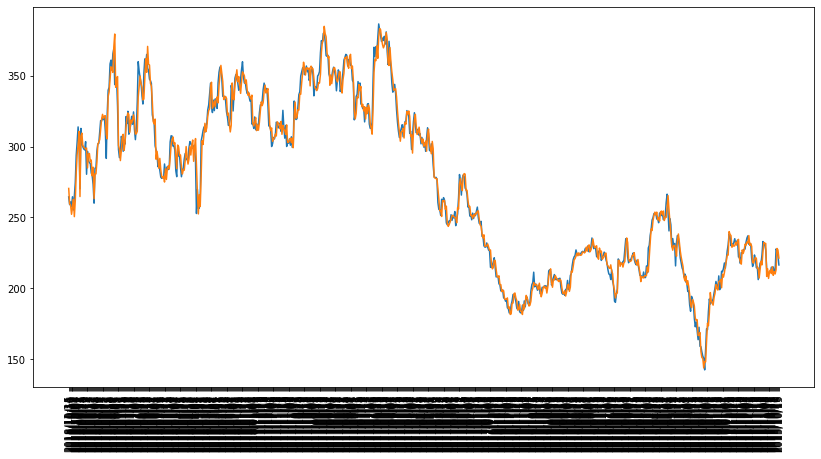

In [ ]:
#COMPARAÇÃO COM MATPLOTLIB
import matplotlib.pyplot as plt   #importando matplotlib

fig, ax = plt.subplots()   #criando eixos
ax.plot(tesla.date, tesla.open)   #gerando o primeiro dado
ax.plot(tesla.date, tesla.close)  #gerando o segundo dado
ax.set_xticklabels(tesla.date, rotation=90)    #rotacionando os ticks do eixo x
plt.rcParams['figure.figsize'] = (22,14)  #aumentando tamanho do gráfico
plt.show()   #plotando gráfico

In [ ]:
#criando time series com filtros
plotly()

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv')   #lendo dataframe de ações da apple

trace = go.Scatter(x=df['Date'], y=df['AAPL.High'])

fig = go.Figure([trace])

fig.update_xaxes(
    rangeslider_visible=True,   #cria um filtro de tempo
    rangeselector=dict(buttons=list([dict(count=1, label="1m", step="month", stepmode="backward"),   #cria botões de filtro de tempo
                                     dict(count=6, label="6m", step="month", stepmode="backward"),
                                     dict(count=1, label="YTD", step="year", stepmode="todate"),
                                     dict(count=1, label="1y", step="year", stepmode="backward"),
                                     dict(step="all")])),
    tickformatstops = [dict(dtickrange=[None, 1000], value="%H:%M:%S.%L ms"),   #conforme dá zoom, os nomes no eixo X fica do jeito que você quiser
                       dict(dtickrange=[1000, 60000], value="%H:%M:%S second"),
                       dict(dtickrange=[60000, 3600000], value="%H:%M minute"),
                       dict(dtickrange=[3600000, 86400000], value="%H:%M hour"),
                       dict(dtickrange=[86400000, 604800000], value="%e° %b day"),
                       dict(dtickrange=[604800000, "M1"], value="%e° %b week"),
                       dict(dtickrange=["M1", "M12"], value="%b %y"),
                       dict(dtickrange=["M12", None], value="%Y")])

fig.update_layout(title_text = 'Apple Stock Price',
                  title_font_size = 30,
                  title_x = 0.5)

fig.show()

In [ ]:
#gráfico de heatmap com go.Heatmap
plotly()

trace = data=go.Heatmap(
                   z=[[1, None, 30, 50, 1], [20, 1, 60, 80, 30], [30, 60, 1, -10, 20]],
                   x=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'],
                   y=['Morning', 'Afternoon', 'Evening'],
                   hoverongaps = False)

fig = go.Figure(data=data)

fig.show()

In [ ]:
#lendo dataset com a população e localização das cidades dos EUA
pop_eua = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
pop_eua.head()

,name,pop,lat,lon
0,New York,8287238,40.730599,-73.986581
1,Los Angeles,3826423,34.053717,-118.242727
2,Chicago,2705627,41.875555,-87.624421
3,Houston,2129784,29.758938,-95.367697
4,Philadelphia,1539313,39.952335,-75.163789


In [ ]:
#gerando gráfico de mapa com go.Scattergeo
plotly()
trace = go.Scattergeo(    #gráfico para mapas
                     locationmode = 'USA-states',  #selecionando localidade
                     lon = pop_eua['lon'],   #variável da longitude
                     lat = pop_eua['lat'],   #variável da latitude
                     text = pop_eua['name'] + '- População: ' + pop_eua['pop'].astype(str),  #colocando os textos quando passa o mouse em cima
                     marker = dict(   
                            size = pop_eua['pop']/5000,   #tamanho dos círculos
                            color = '#e74c3c',   #cor dos círculos
                            line = {'width': 0.5,  #grossura da borda dos círculos
                                    'color': '#2c3e50'},   #cor da borda dos círculos
                            sizemode = 'area')   #definindo que a representação dos círculos é em área
                    )
data = [trace]

layout = go.Layout(
        geo =  {'scope': 'usa',
                'projection': {'type': 'albers usa'},
                'showland': True,
                'landcolor': '#2ecc71',
                'showlakes': True,
                'lakecolor': '#3498db',
                'subunitwidth': 1,
                'subunitcolor': "rgb(255, 255, 255)"
                })

fig = go.Figure(data=data, layout=layout)

fig.update_layout(title = '<b>População americana em 2014<b>',   #o textro entre <b> fica em negrito 
                  title_font_size = 35,
                  title_x = 0.5,
                  title_font_family = "Times New Roman"),



py.iplot(fig)

## Gráficos Legais:

In [ ]:
#rainbow box plots
plotly()
N = 30     # Number of boxes

# generate an array of rainbow colors by fixing the saturation and lightness of the HSL
# representation of colour and marching around the hue.
# Plotly accepts any CSS color format, see e.g. http://www.w3schools.com/cssref/css_colors_legal.asp.
c = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, N)]

# Each box is represented by a dict that contains the data, the type, and the colour.
# Use list comprehension to describe N boxes, each with a different colour and with different randomly generated data:
fig = go.Figure(data=[go.Box(
    y=3.5 * np.sin(np.pi * i/N) + i/N + (1.5 + 0.5 * np.cos(np.pi*i/N)) * np.random.rand(10),
    marker_color=c[i]
    ) for i in range(int(N))])

# formatando o layout
fig.update_layout(
    xaxis=dict(showgrid=True, zeroline=False, showticklabels=False, gridcolor = '#eee'),
    yaxis=dict(showgrid=False, zeroline=False),
    paper_bgcolor='#fff',
    plot_bgcolor='#fff')

fig.show()

In [ ]:
#gerando um scatter plot 3d com go.Scatter3d
plotly()
x = ap.bedrooms   #definido variáveis x,y,z utlilizadas do dataset
y = ap.bathrooms
z = ap.floors

trace1 = go.Scatter3d(
    x=x,y=y,z=z,  #definindo eixos
    mode='markers',  #gráfico de pontos
    marker=dict(size=12, color=z, colorscale='Viridis', opacity=0.8) #alterando tamanho do ponto, a cor segundo uma variável, escala de cores, opacidade
)

data = [trace1]

fig = go.Figure(data=data)

fig.update_layout(margin=dict(l=0,r=0,b=0,t=0))   #definindo as margens

py.iplot(fig)

In [ ]:
#gráfico de fibonacci
plotly()

# Build the rectangles as a heatmap
# specify the edges of the heatmap squares
phi = (1 + np.sqrt(5) )/2. # golden ratio
xe = [0, 1, 1+(1/(phi**4)), 1+(1/(phi**3)), phi]
ye = [0, 1/(phi**3), 1/phi**3+1/phi**4, 1/(phi**2), 1]

z = [ [13,3,3,5],
      [13,2,1,5],
      [13,10,11,12],
      [13,8,8,8]
    ]

fig = go.Figure(data=go.Heatmap(
          x = np.sort(xe),
          y = np.sort(ye),
          z = z,
          type = 'heatmap',
          colorscale = 'Viridis'))

# Add spiral line plot

def spiral(th):
    a = 1.120529
    b = 0.306349
    r = a*np.exp(-b*th)
    return (r*np.cos(th), r*np.sin(th))

theta = np.linspace(-np.pi/13,4*np.pi,1000); # angle
(x,y) = spiral(theta)

fig.add_trace(go.Scatter(x= -x+x[0], y= y-y[0],
     line =dict(color='white',width=3)))

axis_template = dict(range = [0,1.6], autorange = False,
             showgrid = False, zeroline = False,
             linecolor = 'black', showticklabels = False,
             ticks = '' )

fig.update_layout(margin = dict(t=200,r=200,b=200,l=200),
    xaxis = axis_template,
    yaxis = axis_template,
    showlegend = False,
    width = 700, height = 700,
    autosize = False )

fig.show()

In [ ]:
#gráfico de vetores com plotly.figure_factory
import plotly.figure_factory as ff

plotly()

x1,y1 = np.meshgrid(np.arange(0, 2, .2), np.arange(0, 2, .2))
u1 = np.cos(x1)*y1
v1 = np.sin(x1)*y1

fig = ff.create_quiver(x1, y1, u1, v1)

fig.show()

In [ ]:
#gráfico com slider
plotly()

#criando uma figura
fig = go.Figure()

#adicione os traces, um para cada divisão do slider
for step in np.arange(0, 5, 0.1):
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=6),
            name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))

#Faça o 10° trace visível
fig.data[10].visible = True

# Criando e adicionando o slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Slider switched to step: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()